<a href="https://colab.research.google.com/github/katehee/X-ray_pneumonia_classification/blob/master/pneumonia_visualization_of_layers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import random
from numpy import asarray
import seaborn as sns
from tqdm import tqdm

import tensorflow as tf
from tensorflow.keras.preprocessing import image
from keras.utils.data_utils import Sequence
from imblearn.over_sampling import RandomOverSampler
from imblearn.tensorflow import balanced_batch_generator
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout , BatchNormalization
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from keras.callbacks import ReduceLROnPlateau
import cv2

drive.mount('/content/drive')

MessageError: ignored

In [ ]:
categories = ['NORMAL','PNEUMONIA']
img_size = 128 

def get_images(dir): 
    images_array = []
    for category in categories: 
        path = os.path.join(dir, category)
        label = categories.index(category)
        for image in tqdm(os.listdir(path)): 
            try:
                img_arr = cv2.imread(os.path.join(path, image), cv2.IMREAD_GRAYSCALE) #rgb to greyscale 
                resized_arr = cv2.resize(img_arr, (img_size, img_size)) # set image size 
                images_array.append([resized_arr, label])
            except Exception as e:
                print(e)
    return np.array(images_array)

train_dir = '/content/drive/MyDrive/Pneumonia/train'
val_dir = '/content/drive/MyDrive/Pneumonia/val'
test_dir = '/content/drive/MyDrive/Pneumonia/test'

train = get_images(train_dir)
val = get_images(val_dir)
test = get_images(test_dir)

100%|██████████| 3933/3933 [00:38<00:00, 101.06it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  app.launch_new_instance()
100%|██████████| 390/390 [00:03<00:00, 103.62it/s]


In [ ]:
def format_img(data): #resize data for deep learning
  x = []
  y = []
  for feature, label in data: 
    x.append(np.array(feature).reshape(img_size,img_size,1))
    y.append(np.array(label))
  return np.array(x), np.array(y)

x_train, y_train = format_img(train)
x_val, y_val = format_img(val)
x_test, y_test = format_img(test)

In [ ]:
epoch_size = 15
batch_size = 32 

train_datagen = ImageDataGenerator(
        rescale=1.0/255,
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range = 10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1)  # randomly shift images vertically (fraction of total height)

test_datagen = ImageDataGenerator(rescale=1.0/255)

train_generator = train_datagen.flow(x_train, y_train, batch_size=batch_size)
val_generator = train_datagen.flow(x_val, y_val, batch_size=batch_size)
test_generator = test_datagen.flow(x_test, y_test, batch_size=len(x_test))

In [ ]:
#@title 
x_train, y_train, x_val, y_val, x_test, y_test = [], [], [], [], [], []

for pixels, label in train:
    x_train.append(pixels)
    y_train.append(label)

for pixels, label in test:
    x_test.append(pixels)
    y_test.append(label)
    
for pixels, label in val:
    x_val.append(pixels)
    y_val.append(label)

# resize data for neural network training
x_train = np.array(x_train).reshape(-1, img_size, img_size, 1)
y_train = np.array(y_train)

x_val = np.array(x_val).reshape(-1, img_size, img_size, 1)
y_val = np.array(y_val)

x_test = np.array(x_test).reshape(-1, img_size, img_size, 1)
y_test = np.array(y_test)

In [ ]:
#@title create_plot
def create_plot(history, epoch_size): 
    epochs = [i for i in range(epoch_size)]
    fig , ax = plt.subplots(1,2)
    train_acc = history.history['accuracy']
    train_loss = history.history['loss']
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']
    fig.set_size_inches(12,6)

    ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
    ax[0].plot(epochs , val_acc , 'ro-' , label = 'Validation Accuracy')
    ax[0].set_title('Training & Validation Accuracy')
    ax[0].legend()
    ax[0].set_xlabel("Epochs")
    ax[0].set_ylabel("Accuracy")

    ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
    ax[1].plot(epochs , val_loss , 'r-o' , label = 'Validation Loss')
    ax[1].set_title('Testing Accuracy & Loss')
    ax[1].legend()
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("Training & Validation Loss")
    plt.show()

##balancedDataGenerator

In [ ]:
#@title 
from keras.utils.data_utils import Sequence
from imblearn.over_sampling import RandomOverSampler
from imblearn.tensorflow import balanced_batch_generator

class BalancedDataGenerator(Sequence):
    """ImageDataGenerator + RandomOversampling"""
    def __init__(self, x, y, datagen, batch_size= batch_size):
        self.datagen = datagen
        self.batch_size = min(batch_size, x.shape[0])
        datagen.fit(x)
        self.gen, self.steps_per_epoch = balanced_batch_generator(x.reshape(x.shape[0], -1), y, sampler=RandomOverSampler(), batch_size=self.batch_size, keep_sparse=True)
        self._shape = (self.steps_per_epoch * batch_size, *x.shape[1:])
        
    def __len__(self):
        return self.steps_per_epoch

    def __getitem__(self, idx):
        x_batch, y_batch = self.gen.__next__()
        x_batch = x_batch.reshape(-1, *self._shape[1:])
        return self.datagen.flow(x_batch, y_batch, batch_size=self.batch_size).next()

balanced_gen = BalancedDataGenerator(x_train, y_train, train_datagen, batch_size=32) 
steps_per_epoch = balanced_gen.steps_per_epoch #generated_image, label = train.__getitem__(18)
y_gen = [balanced_gen.__getitem__(0)[1] for i in range(steps_per_epoch)]
print(np.unique(y_gen, return_counts=True)) #number of each label changes every training *

(array([0, 1]), array([3919, 3921]))


###visualization of activation layers

- VGG16
- DenseNet
- ResNet
- XCeption
- InCeption

In [ ]:
#load libraries
from keras.preprocessing import image
import keras
import numpy as np
from keras.models import load_model
import matplotlib.pyplot as plt
from keras import models
%matplotlib inline

In [ ]:
#load the trained model

from keras.applications.vgg16 import VGG16
model = VGG16()
# model.summary()  

553476096/553467096 [==============================] - 9s 0us/step


In [ ]:
img_name = os.listdir('/content/drive/MyDrive/Pneumonia/train/PNEUMONIA')[0]
img_path = '/content/drive/MyDrive/Pneumonia/train/PNEUMONIA/' + img_name
img_path

'/content/drive/MyDrive/Pneumonia/train/PNEUMONIA/person54_bacteria_258.jpeg'

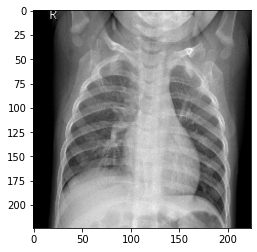

In [ ]:
#Preprocess the image into a 4D tensor
img_size = 224
img = image.load_img(img_path, target_size=(img_size,img_size))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

# The model was trained on inputs that were preprocessed in the following way:
img_tensor /= 255. # 

#display the image
plt.imshow(img_tensor[0])
plt.show()

In [ ]:
# display the numbers of the different layers in the trained model
model.summary()
for i, layer in enumerate(model.layers):
   print(i, layer.name)

In [ ]:
# Extracts the outputs of the top layers everything upto the GAP layer:
layer_outputs = [layer.output for layer in model.layers[1:18]] #this model has 18 layers just before the GAP layer

# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

(1, 224, 224, 64)


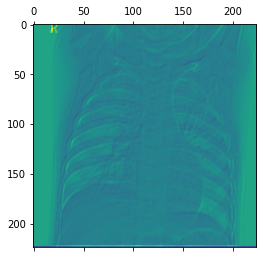

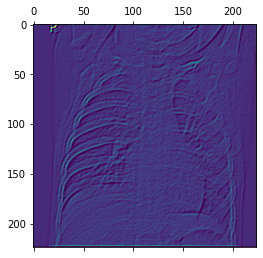

In [ ]:
# This will return a list of Numpy arrays: one array per layer activation
activations = activation_model.predict(img_tensor)

# This is the activation of the first convolution layer for our image input:
second_layer_activation = activations[1]
print(second_layer_activation.shape) #(1, 300, 300, 64)

#It's a 300*300 feature map with 64 channels. Visualizing the 60th and 10th channel:
plt.matshow(second_layer_activation[0, :, :, 60], cmap='viridis')
plt.show()

#This channel appears to encode a diagonal edge detector. 
# 10th channel, since the specific filters learned by convolution layers are not deterministic.
plt.matshow(second_layer_activation[0, :, :, 10], cmap='viridis')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


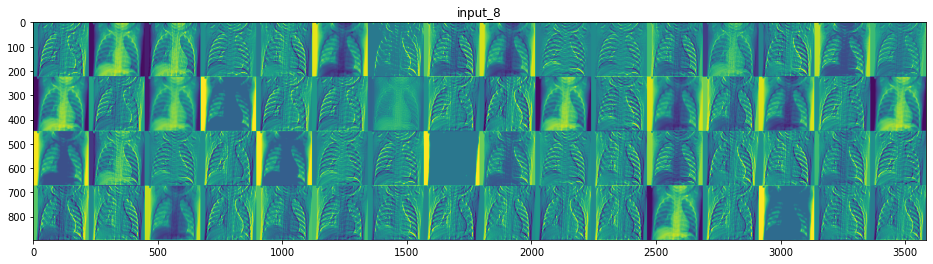

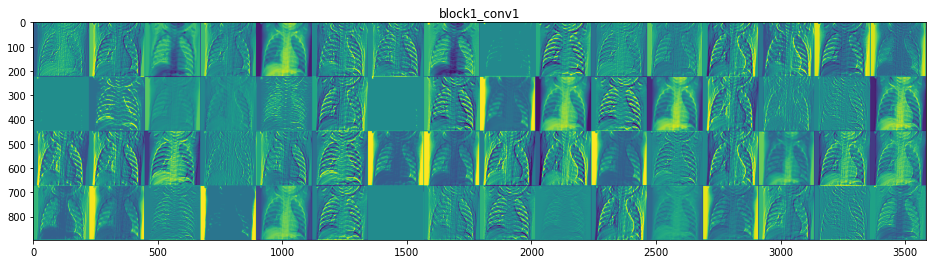

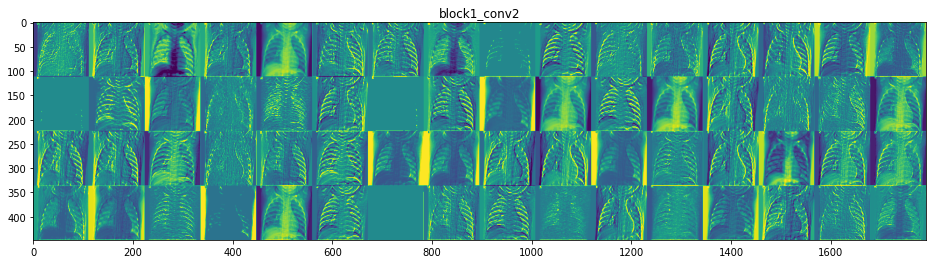

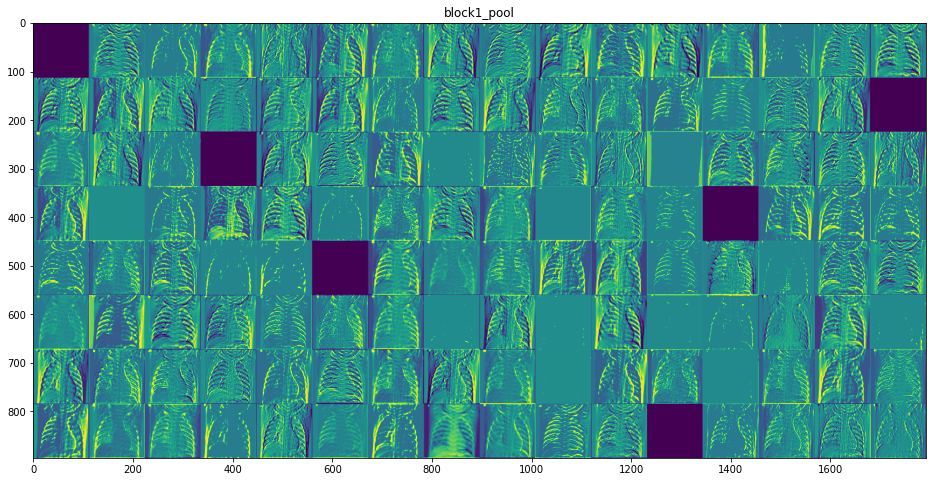

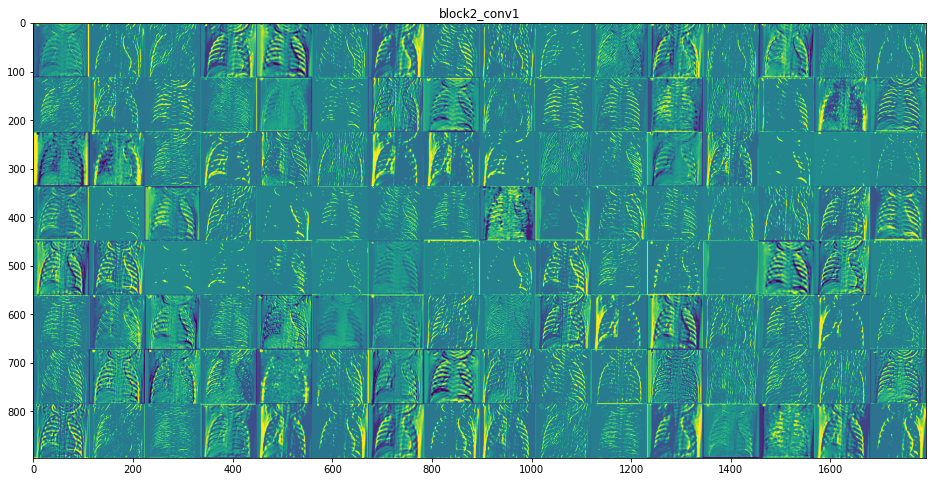

...

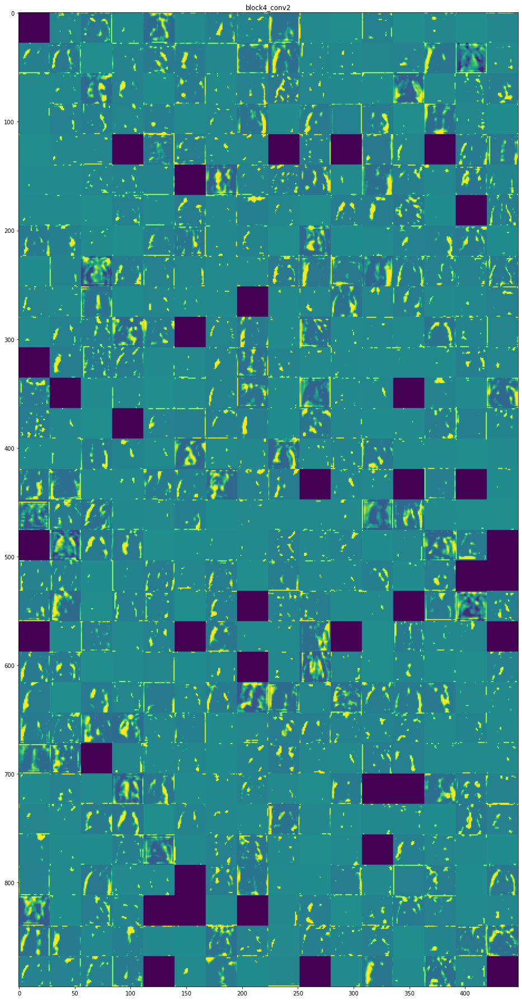

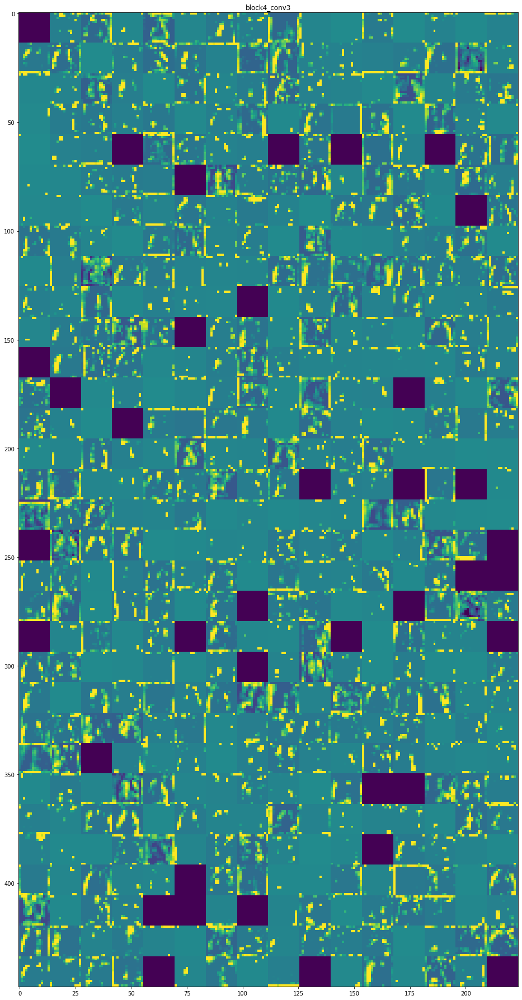

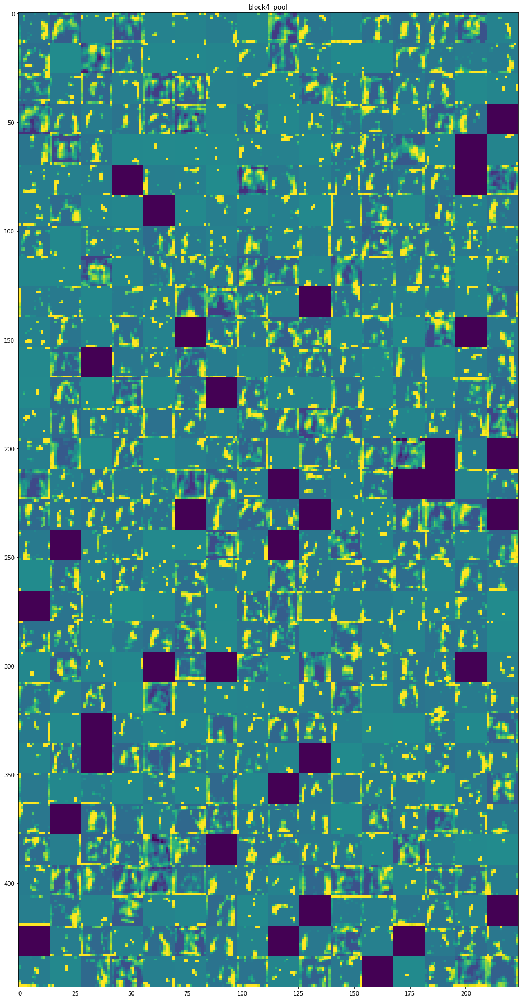

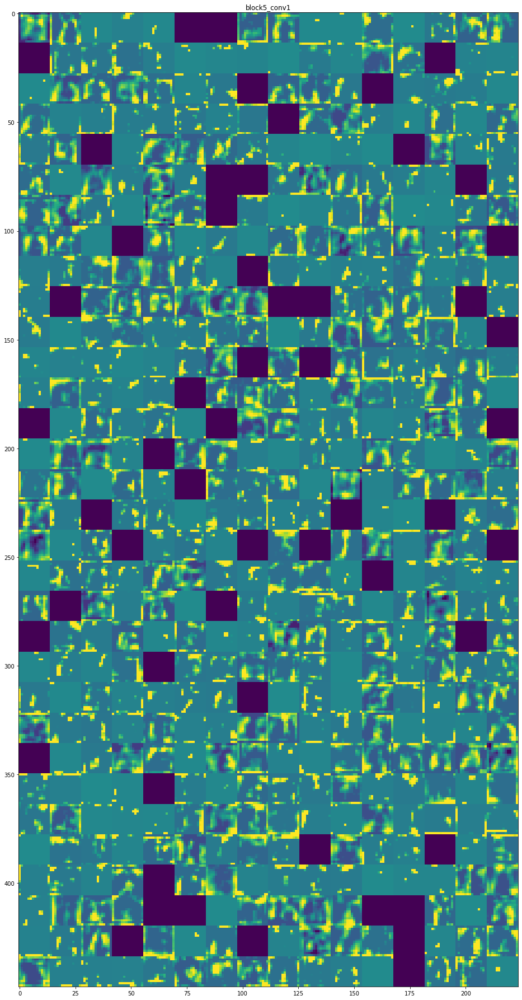

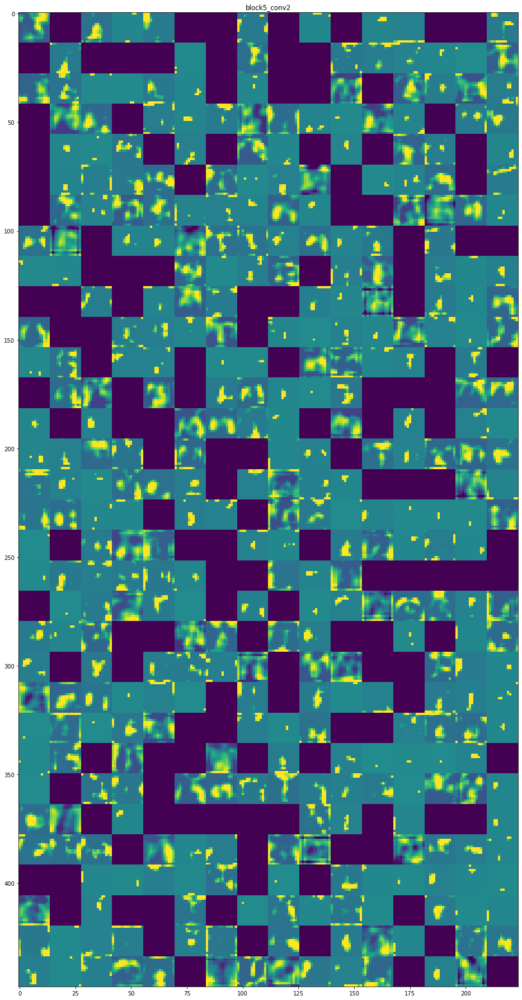

In [ ]:
# Names of the layers to have them as part of the plot
layer_names = []
for layer in model.layers[:18]:
    layer_names.append(layer.name)

images_per_row = 16 

# Display feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # Tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # Tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64 
            channel_image += 128 
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()